In [1]:
import fastbook
fastbook.setup_book()
from fastbook import *
from fastai.vision.widgets import *

In [2]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [3]:
btn_upload = SimpleNamespace(data = ['images/apollo.jpg'])

In [4]:
img = PILImage.create(btn_upload.data[-1])

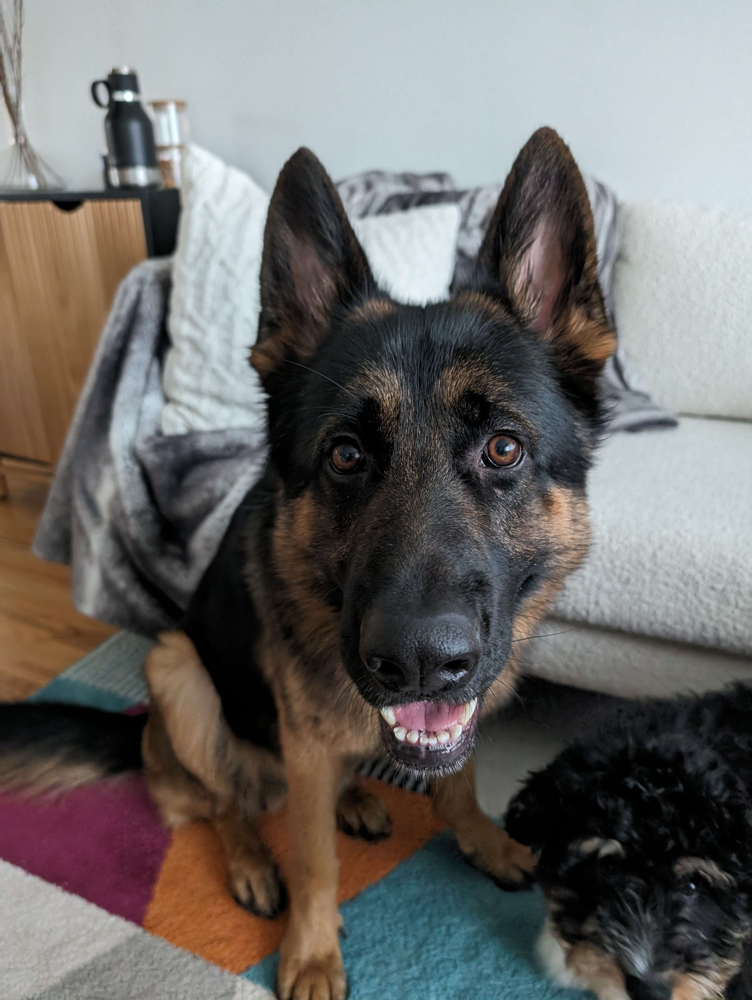

In [5]:
img

In [6]:
out_pl = widgets.Output()
out_pl.clear_output()

with out_pl: display(img.to_thumb(128, 128))
out_pl

Output()

In [7]:
path = Path()
learn_inf = load_learner(path/'dogs.pkl')

In [8]:
pred, pred_idx, probs = learn_inf.predict(img)

In [9]:
label_pred = widgets.Label()
label_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
label_pred

Label(value='Prediction: german shepherd; Probability: 1.0000')

In [10]:
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [11]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    label_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [12]:
btn_upload = widgets.FileUpload()

In [13]:
VBox([widgets.Label('Select your dog!'),
      btn_upload, btn_run, out_pl, label_pred])